In [1]:
import os
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.models import load_model
from sklearn.preprocessing import MinMaxScaler
import math
import tensorflow as tf
sc = MinMaxScaler(feature_range=(0,1)) #normalisasi dari 0 - 1

In [2]:
!pip show tensorflow

Name: tensorflow
Version: 2.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: C:\Users\ThinkPad\AppData\Local\Programs\Python\Python311\Lib\site-packages
Requires: tensorflow-intel
Required-by: 


In [3]:
def view_loss_accuracy_history(history,nama):
  #Melihat plot evaluasi model
  plt.figure(figsize=(15,6))
  plt.plot(history.history['loss'])
  plt.plot(history.history['accuracy'])
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.title('Riwayat Train ' + nama)
  plt.savefig('dokumentasi/result/'+nama+'_train_history.png')
  #plt.show()

def data_clean(path_data):
  df = pd.read_csv(path_data)
  df = df.drop('Unnamed: 0', axis=1)
  df = df.sort_values('date', ascending=True)
  df.set_index('date', inplace=True)
  return df
  

def predict(df, timesteps, model):
  # test.reshape(1,-1)
  # test = sc.fit_transform(test)
  df_to_train = df[:485] #data train
  df_to_test = df[485:] #data test
  data_total= pd.concat([df_to_train['close'], df_to_test['close']],  axis=0) #digabungin
  #inputnya dimulai dari total data dikurang data test dikurang timestep (jadi dikurang 30 hari sebelum data terbaru dari data train)
  inputs= data_total[len(data_total)-len(df_to_test)-timesteps:].values
  inputs = inputs.reshape(-1,1)
  inputs = sc.fit_transform(inputs)

  x_test = [] #loop dari 30 dengan ukuran data yang 485 - 30 = 455 itu
  for i in range(timesteps, inputs.shape[0]):
    x_test.append(inputs[i-timesteps:i, 0])

  x_test = np.array(x_test)
  x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))
  predict = model.predict(x_test)
  #mse = mean_squared_error(predict,test)
  #mae = mean_absolute_error(predict, test)
        #print(mae_)
  #rmse = math.sqrt(mse)
  #r2 = r2_score(predict, test)
  predict = sc.inverse_transform(predict)
  return predict


def view_result(pred_res, test_set, model_name):
  plt.figure(figsize=(15,8))
  plt.plot(test_set, color='red', label='Harga Sebenarnya Saham ')
  plt.plot(pred_res, color='blue', label='Harga Prediksi Saham ')
  plt.title('Prediksi Harga Saham '+model_name, fontsize=20)
  plt.xlabel('Waktu', fontsize=15)
  plt.ylabel('Harga Saham ', fontsize=15)
  plt.legend()
  plt.savefig('dokumentasi/model_check_mei/'+model_name+'_train_history.png')
  #plt.show()


def evaluate(pred, test):
  #print(pred,test)
  len_pred = len(pred)
  pred = pred.reshape(len_pred)
  #pred = pred.tolist()
  #test = test.tolist()
  total = np.concatenate((pred, test))
  #print(total)
  total = total.reshape(-1,1)
  total = sc.fit_transform(total)
  #print(total)
  arr_pred = total[len_pred:]
  arr_test = total[:len_pred]
  #print(len(arr_pred), len(arr_test))
  mse = mean_squared_error(arr_pred,arr_test)
  mae = mean_absolute_error(arr_pred, arr_test)
  rmse = math.sqrt(mse)
  r2 = r2_score(arr_pred, arr_test)
  return mse, mae, rmse, r2
  

In [4]:
list_asii = []
list_amrt = []
list_untr = []
list_unvr = []
list_mapi = []
list_inkp = []
list_intp = []
list_aces = []
list_sido = []
list_hrum = []

In [5]:
path_dir = "data"
list_file = os.listdir(path_dir)
asii_data = path_dir+"/"+list_file[2]
amrt_data = path_dir+"/"+list_file[1]
untr_data = path_dir+"/"+list_file[9]
unvr_data = path_dir+"/"+list_file[10]
mapi_data = path_dir+"/"+list_file[7]
inkp_data = path_dir+"/"+list_file[5]
intp_data = path_dir+"/"+list_file[6]
aces_data = path_dir+"/"+list_file[0]
sido_data = path_dir+"/"+list_file[8]
hrum_data = path_dir+"/"+list_file[4]


In [6]:
list_data = [asii_data, amrt_data, untr_data, unvr_data, mapi_data, inkp_data, intp_data, aces_data, sido_data, hrum_data]
model_path_dir = "D:\TA\PL\main_train_code\model"
list_model = os.listdir(model_path_dir)
list_saham = ['asii', 'amrt', 'untr', 'unvr', 'mapi', 'inkp', 'intp', 'aces', 'sido', 'hrum']

In [7]:
for model_name in list_model:
    for saham in list_saham:
        if(saham in model_name):
            if(saham == 'asii'):
                list_asii.append(model_name)
            elif(saham == 'amrt'):
                list_amrt.append(model_name)
            elif(saham == 'untr'):
                list_untr.append(model_name)
            elif(saham == 'unvr'):
                list_unvr.append(model_name)
            elif(saham == 'mapi'):
                list_mapi.append(model_name)
            elif(saham == 'inkp'):
                list_inkp.append(model_name)
            elif(saham == 'intp'):
                list_intp.append(model_name)
            elif(saham == 'aces'):
                list_aces.append(model_name)
            elif(saham == 'sido'):
                list_sido.append(model_name)
            elif(saham == 'hrum'):
                list_hrum.append(model_name)

           

In [8]:
list_model_saham =[list_asii, list_amrt, list_untr, list_unvr, list_mapi, list_inkp, list_intp, list_aces, list_sido, list_hrum]

asii

asii_1_100_0.2_100_8.h5
3/3 [==============================] - 2s 19ms/step
asii_1_100_0.2_200_8.h5
3/3 [==============================] - 1s 20ms/step
asii_1_100_0_100_8.h5
3/3 [==============================] - 2s 13ms/step
asii_1_100_0_200_8.h5
3/3 [==============================] - 1s 16ms/step
asii_1_200_0_100_8.h5
3/3 [==============================] - 1s 9ms/step
asii_1_300_0_100_8.h5
3/3 [==============================] - 1s 11ms/step
asii_5_100_0_100_8.h5
3/3 [==============================] - 4s 15ms/step
asii_5_200_0_100_8.h5
3/3 [==============================] - 4s 24ms/step
asii_5_300_0_100_8.h5
3/3 [==============================] - 3s 24ms/step
amrt
amrt_1_100_0.2_100_8.h5
3/3 [==============================] - 1s 15ms/step
amrt_1_100_0.2_200_8.h5
3/3 [==============================] - 2s 6ms/step
amrt_1_100_0_100_8.h5
3/3 [==============================] - 2s 14ms/step
amrt_1_100_0_200_8.h5
3/3 [==============================] - 1s 13ms/step
amrt_1_200_0_100_8.h5

C:\Users\ThinkPad\AppData\Local\Temp\ipykernel_14716\3321439416.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,8))


untr_1_100_0_100_32.h5
3/3 [==============================] - 1s 11ms/step
untr_1_100_0_100_8.h5
3/3 [==============================] - 2s 18ms/step
untr_1_100_0_200_32.h5
3/3 [==============================] - 2s 6ms/step
untr_1_100_0_200_8.h5
3/3 [==============================] - 1s 16ms/step
untr_1_200_0_100_8.h5
3/3 [==============================] - 2s 9ms/step
untr_1_300_0_100_8.h5
3/3 [==============================] - 1s 12ms/step
untr_5_100_0_100_8.h5
3/3 [==============================] - 3s 10ms/step
untr_5_200_0_100_8.h5
3/3 [==============================] - 4s 19ms/step
unvr
unvr_1_100_0.2_100_32.h5
3/3 [==============================] - 1s 12ms/step
unvr_1_100_0.2_100_8.h5
3/3 [==============================] - 2s 17ms/step
unvr_1_100_0.2_200_8.h5
3/3 [==============================] - 2s 12ms/step
unvr_1_100_0_100_32.h5
3/3 [==============================] - 1s 13ms/step
unvr_1_100_0_100_8.h5
3/3 [==============================] - 1s 14ms/step
unvr_1_100_0_200_32.h5
3/

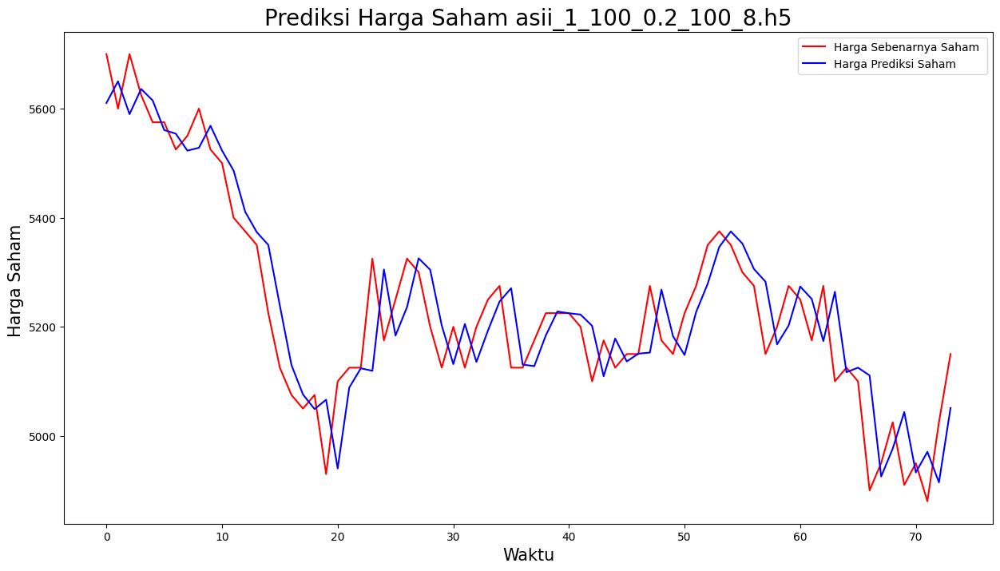

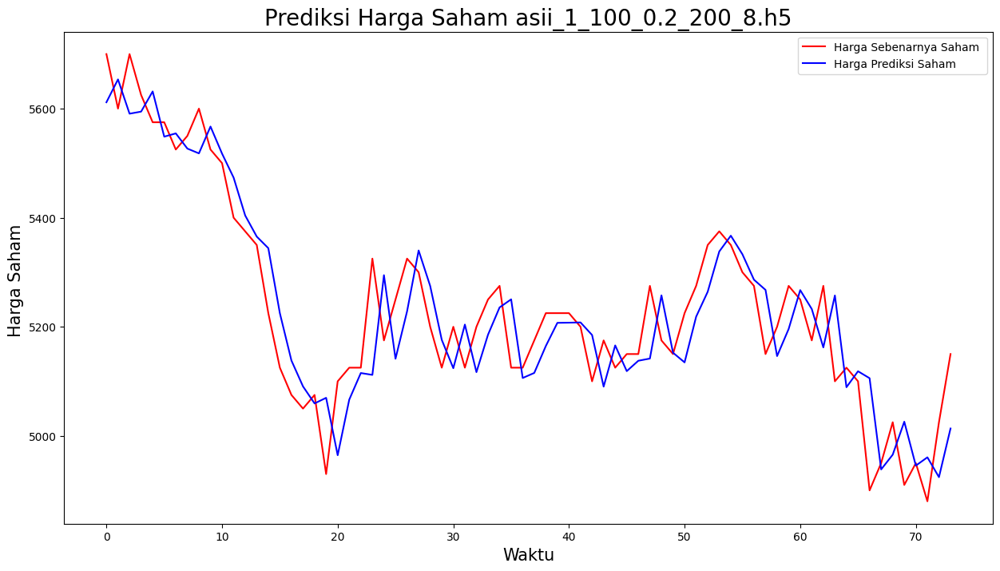

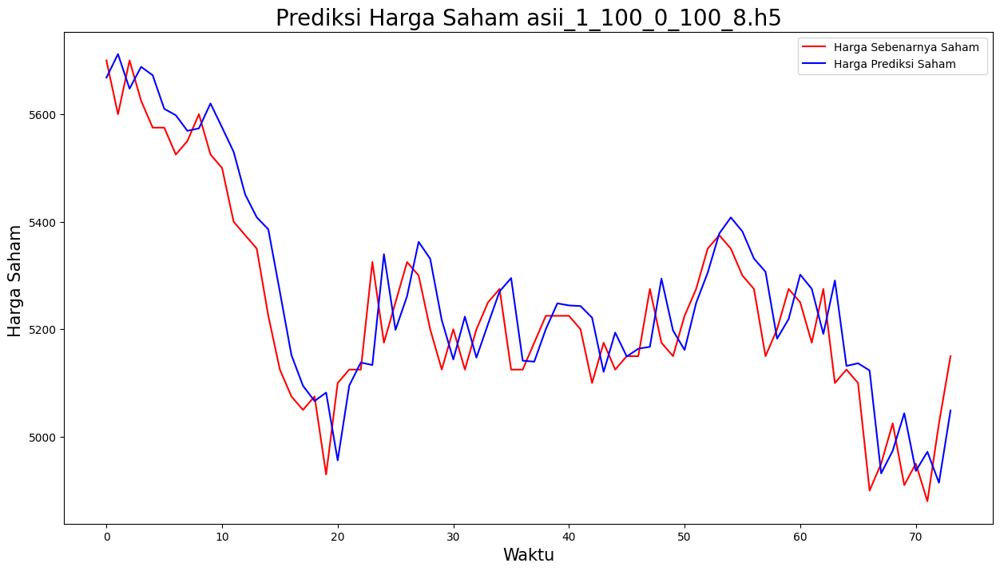

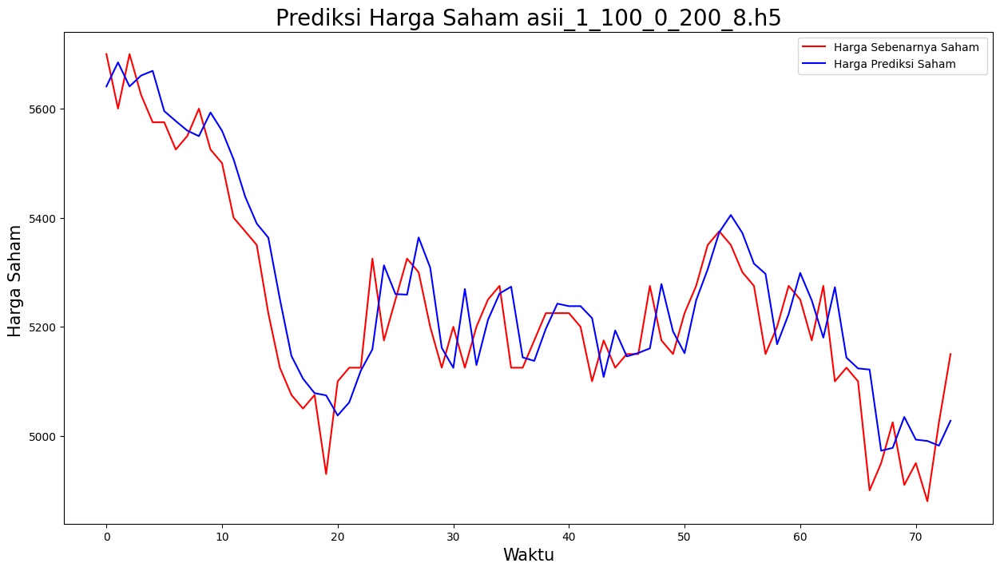

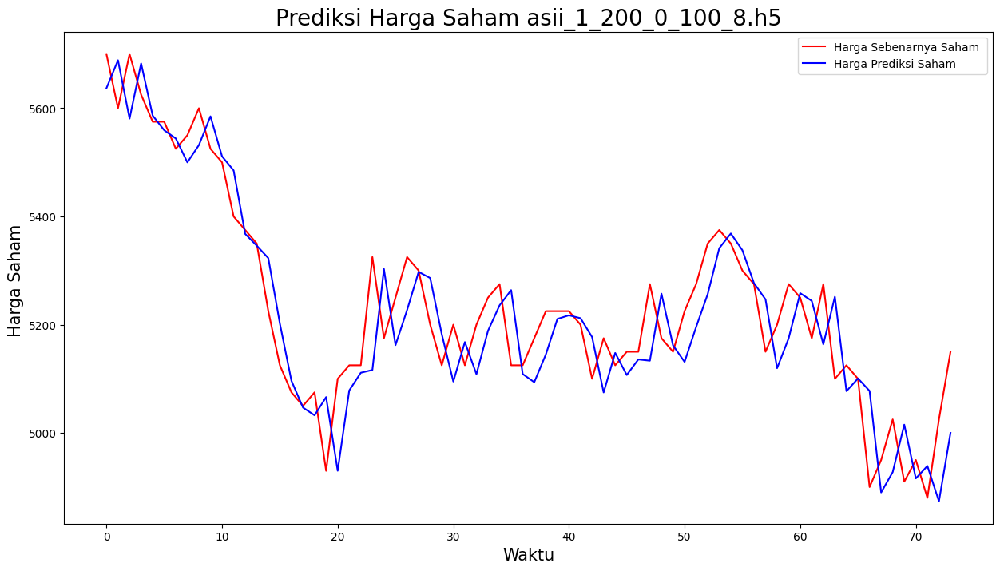

...

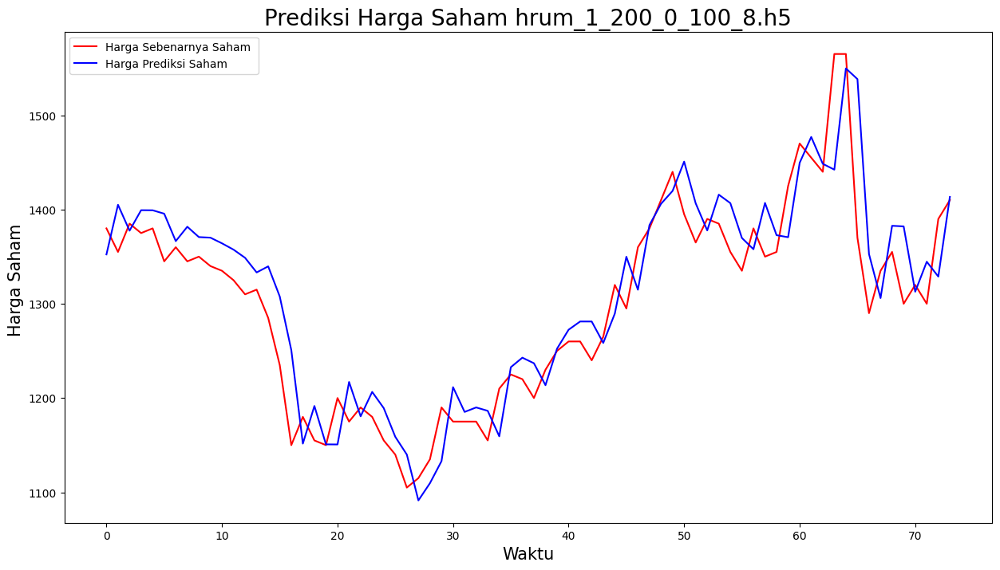

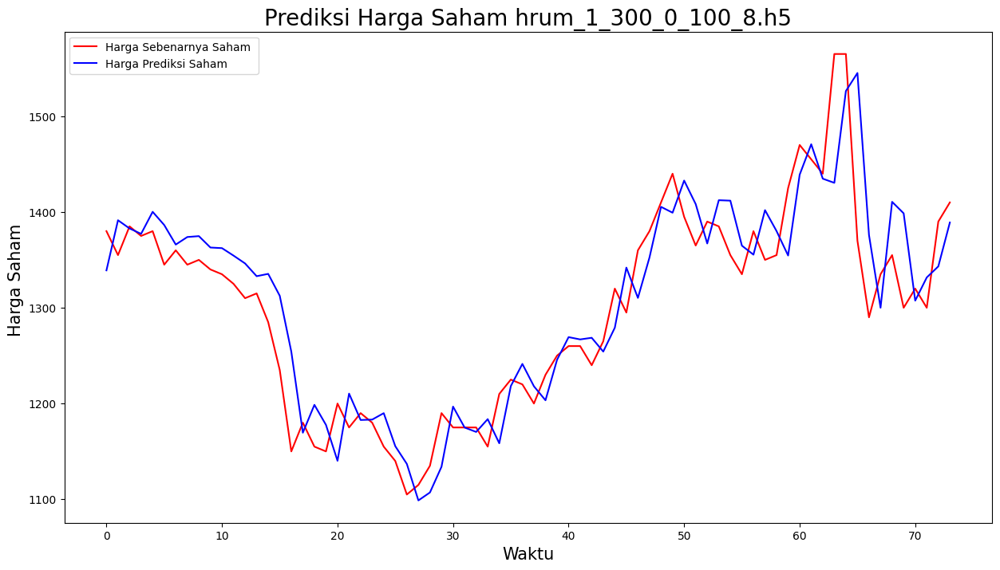

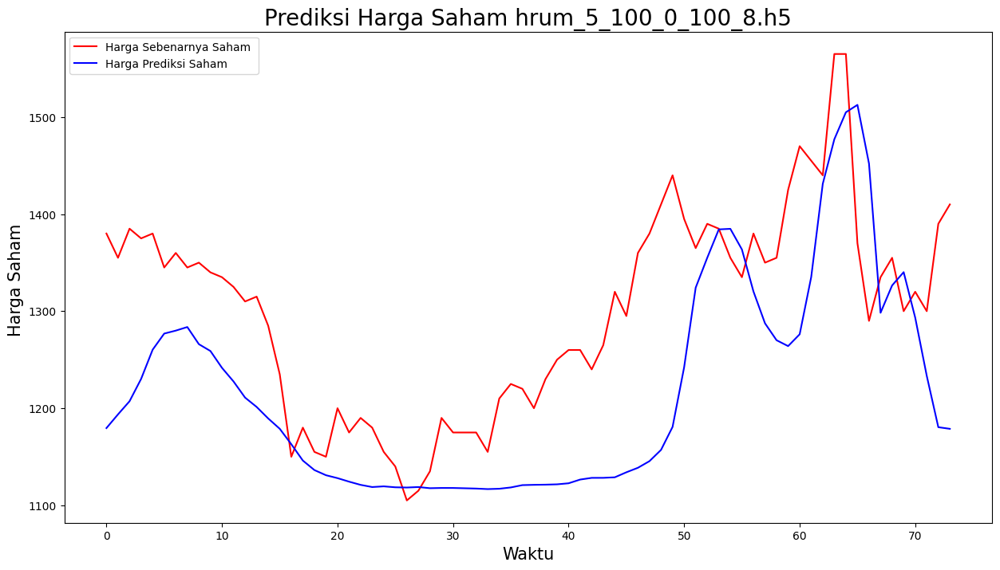

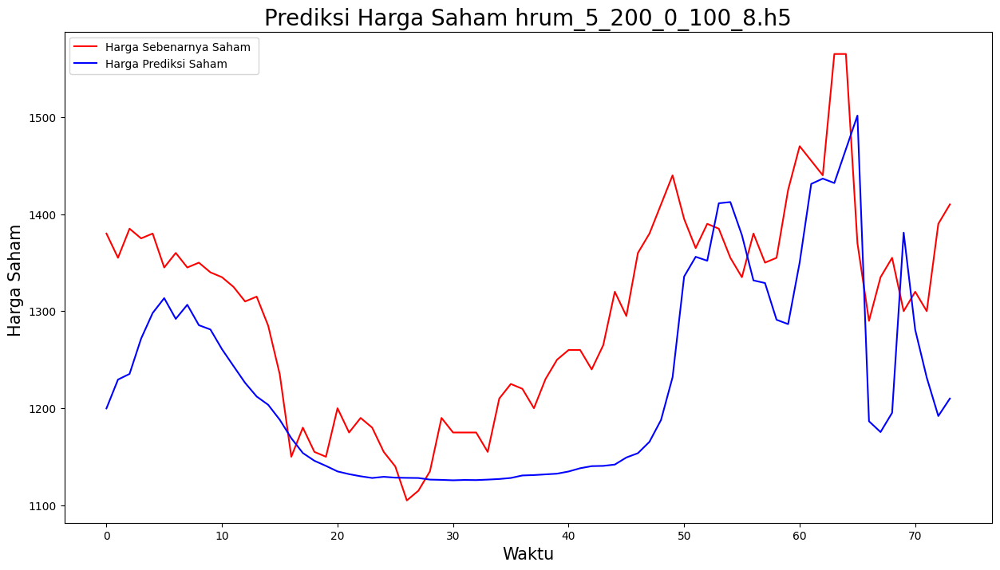

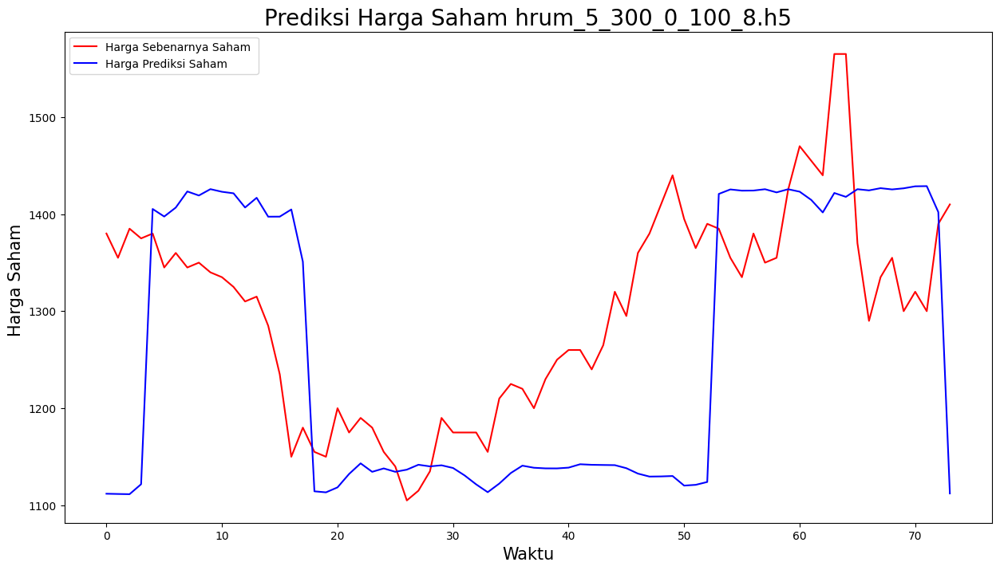

In [9]:
dic_res = {'model_name' : [], 'stock' : [], 'timestep': [], 'mse' : [], 'mae' : [], 'rmse' : [], 'r2' : []}
for i in range(len(list_saham)):
    print(list_saham[i])
    df = list_data[i]
    df = data_clean(df)
    for j in range(len(list_model_saham[i])):
        curr_model = load_model(model_path_dir+"\\"+list_model_saham[i][j])
        dic = curr_model.get_config()
        timestep = dic['layers'][0]['config']['batch_input_shape'][1]
        print(list_model_saham[i][j])
        df_test = df[485:]
        df_test = (df_test['close'].values)
        pred_res = predict(df, timestep, curr_model)
        view_result(pred_res, df_test, list_model_saham[i][j])
        mse, mae, rmse, r2 = evaluate(pred_res, df_test)
        dic_res['model_name'].append(list_model_saham[i][j])
        dic_res['stock'].append(list_saham[i])
        dic_res['timestep'].append(timestep)
        dic_res['mse'].append(mse)
        #print(mae_)
        dic_res['mae'].append(mae)
        dic_res['rmse'].append(rmse)
        dic_res['r2'].append(r2)
        
        

In [10]:
res_all_model = pd.DataFrame(dic_res)

In [11]:
res_all_model.head()
res_all_model.to_csv('dokumentasi/evaluation_result_mei.csv')